<a href="https://colab.research.google.com/github/ValensioLeonard/Automatic-License-Plate-Detection-and-Recognition/blob/main/Notebook/Car_Plate_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **SKRIPSI: CAR PLATE DETECTION**

Article Resources:

1.   https://towardsdatascience.com/how-to-detect-license-plates-with-python-and-yolo-8842aa6d25f7
2. https://medium.com/analytics-vidhya/auto-annotate-images-for-tensorflow-object-detection-19b59f31c4d9
3. https://medium.com/swlh/tensorflow-2-object-detection-api-with-google-colab-b2af171e81cc
4. https://towardsdatascience.com/train-an-object-detector-using-tensorflow-2-object-detection-api-in-2021-a4fed450d1b9


Data Sources:

1. https://www.kaggle.com/imamdigmi/indonesian-plate-number
2. https://www.kaggle.com/gunawan26/labelled-indonesian-car-and-plate-number
3. https://www.kaggle.com/firqaaa/indonesian-vehicle-plate-numbers


# **Setup Environment**

In [ ]:
## UNUSED

# !git clone https://github.com/ultralytics/yolov3  # clone
# %cd yolov3
# %pip install -qr requirements.txt  # install

# import torch
# from yolov3 import utils
# display = utils.notebook_init()  # checks

In [4]:
%tensorflow_version 2.5

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `2.5`. This will be interpreted as: `2.x`.


TensorFlow 2.x selected.


In [5]:
# IMPORT NECCESSARY MODULES
import os, sys
import shutil
import random
import pandas
from xml.etree.ElementTree import ElementTree
import pandas as pd
import re

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from random import randint

# MOUNT GDRIVE
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# LINK NOTEBOOK PATH TO GOOGLEDRIVE MAIN NOTEBOOK DIRECTORY

nb_path = '/content/drive/MyDrive/SKRIPSI/ML_Model/Notebook'
# os.symlink('/content/drive/My Drive/Colab Notebooks', nb_path)
sys.path.insert(0, nb_path)  # or append(nb_path)

In [7]:
# CHANGE DIRECTORY

os.chdir('/content/drive/MyDrive/SKRIPSI/ML_Model/Notebook')
print(os.getcwd())

/content/drive/MyDrive/Colab Notebooks


In [ ]:
# ! pip install -q kaggle

# ! chmod 600 kaggle/kaggle.json

# import os 
# os.environ["KAGGLE_CONFIG_DIR"] = os.path.abspath("./kaggle/")

# !kaggle datasets download -d imamdigmi/indonesian-plate-number
# !kaggle datasets download -d firqaaa/indonesian-vehicle-plate-numbers/version/1
# !kaggle datasets download -d gunawan26/labelled-indonesian-car-and-plate-number

# !mkdir data
# !unzip indonesian-plate-number -d data
# !unzip labelled-indonesian-car-and-plate-number.zip -d data
# !unzip indonesian-vehicle-plate-numbers -d data

# **Data Preparation**

In [ ]:
train_annotations_xml = os.listdir('./data/Plate Number Data/annotations/train')
test_annotations_xml = os.listdir('./data/Plate Number Data/annotations/test')

def generate_annotations_yolo_format(loc, type):
  class_list = []
  xmin_list = []
  ymin_list = []
  xmax_list = []
  ymax_list = []
  file_names_list = []

  for annot in loc:
    location = os.path.join('./data/Plate Number Data/annotations', type, annot)
    tree = ElementTree()
    tree.parse(location)
    roottree = tree.getroot()

    class_list.append(0)
    xmin_list.append(roottree[6][4][0].text)
    ymin_list.append(roottree[6][4][1].text)
    xmax_list.append(roottree[6][4][2].text)
    ymax_list.append(roottree[6][4][3].text)
    file_names_list.append(annot[:-4])

    annot_table = pd.DataFrame([class_list, xmin_list, ymin_list, xmax_list, ymax_list, file_names_list]).T
    annot_table.columns = ['class', 'xmin', 'ymin', 'xmax', 'ymax', 'filename']
    annot_table.sort_values('filename', inplace = True)

  return annot_table

In [ ]:
annot_train = generate_annotations_yolo_format(train_annotations_xml, 'train')
annot_test = generate_annotations_yolo_format(test_annotations_xml, 'test')

In [ ]:
train_images_files = os.listdir('./data/Plate Number Data/images/train')
train_images_files = pd.DataFrame(train_images_files, columns = ['files'])

test_images_files = os.listdir('./data/Plate Number Data/images/test')
test_images_files = pd.DataFrame(test_images_files, columns = ['files'])

In [ ]:
def clean_filename(string_data):
  list_string = []
  for string in string_data:
    string = re.sub(r'[\\.jpeg|\\.jpg|\\.png]',"",string)
    if string.startswith("IMG"):
      list_string.append(string[-6:])
    else:
      list_string.append(string[0:4])
  return list_string

In [ ]:
train_images_files['index_cleaned'] = clean_filename(train_images_files['files'])
test_images_files['index_cleaned'] = clean_filename(test_images_files['files'])

In [ ]:
annot_train['index_cleaned'] = clean_filename(annot_train['filename'])
annot_test['index_cleaned'] = clean_filename(annot_test['filename'])

In [ ]:
train_images_files.sort_values('index_cleaned', inplace = True)
annot_train.sort_values('index_cleaned', inplace = True)

test_images_files.sort_values('index_cleaned', inplace = True)
annot_test.sort_values('index_cleaned', inplace = True)

In [ ]:
training_data = pd.merge(train_images_files, annot_train, on='index_cleaned')
training_data = training_data[~training_data['index_cleaned'].duplicated()].reset_index(drop = True)

test_data = pd.merge(test_images_files, annot_test, on='index_cleaned')
test_data = test_data[~test_data['index_cleaned'].duplicated()].reset_index(drop = True)

Save or load data to avoid lengthy data cleansing process

In [ ]:
training_data_path = './data/Plate Number Data/training_data.csv'
test_data_path = './data/Plate Number Data/testing_data.csv'

try:
  training_data.to_csv(training_data_path, index = False)
  test_data.to_csv(test_data_path, index = False)
except:
  print("Loading Data")
  training_data = pd.read_csv(training_data_path)
  test_data = pd.read_csv(test_data_path)

Loading Data


In [ ]:
training_data.head()

,files,index_cleaned,class,xmin,ymin,xmax,ymax,filename
0,100.E 6467 QW-09-20.jpeg,100E,0,5,7,429,158,100.E 6467 QW-09-20
1,101.E 4604 PS-09-17.jpeg,101E,0,4,3,459,181,101.E 4604 PS-09-17
2,102.E 6984 P-07-20.jpeg,102E,0,1,1,102,49,102.E 6984 P-07-20
3,103.E 6387 PL-04-20.jpeg,103E,0,3,2,384,144,103.E 6387 PL-04-20
4,104.E 4939 PAE-07-21.jpeg,104E,0,7,6,336,131,104.E 4939 PAE-07-21


In [ ]:
test_data.head()

,files,index_cleaned,class,xmin,ymin,xmax,ymax,filename
0,351.E 6730 RC-07-19.jpeg,351E,0,3,2,287,115,351.E 6730 RC-07-19
1,352.E 5053 RG-09-20.jpeg,352E,0,6,1,570,229,352.E 5053 RG-09-20
2,353.E 6270 SM-06-20.jpeg,353E,0,4,3,629,325,353.E 6270 SM-06-20
3,354.E 6250 PAJ-02-22.jpeg,354E,0,2,2,494,220,354.E 6250 PAJ-02-22
4,355.E 6547 PAF-09-21.jpeg,355E,0,5,3,453,173,355.E 6547 PAF-09-21


In [ ]:
def bounding_box_sample_plot(data_table, type):
  random_integer = randint(0,len(data_table))
  # Open image based on the location
  full_dir = os.path.join('./data/Plate Number Data/images', type, data_table.loc[random_integer, 'files'])
  im = Image.open(full_dir)
  
  # Create figure and axes
  fig, ax = plt.subplots()

  # Display the image
  ax.imshow(im)

  # Create a Rectangle patch
  xmin= int(data_table.loc[random_integer, 'xmin'])
  ymin= int(data_table.loc[random_integer, 'ymin'])
  xmax= int(data_table.loc[random_integer, 'xmax'])
  ymax= int(data_table.loc[random_integer, 'ymax'])
  print('xmin: {}'.format(xmin))
  print('ymin: {}'.format(ymin))
  print('xmax: {}'.format(xmax))
  print('ymax: {}'.format(ymax))
  print('Data: {}'.format(random_integer))
  rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=5, edgecolor='r', facecolor='none')

  # Add the patch to the Axes
  ax.add_patch(rect)

  plt.show()

xmin: 21
ymin: 34
xmax: 645
ymax: 287
Data: 56


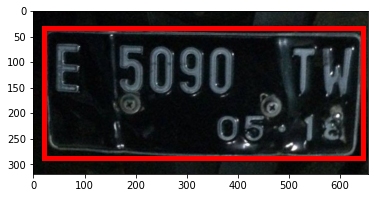

In [ ]:
bounding_box_sample_plot(data_table=training_data, type= 'train')

xmin: 238
ymin: 322
xmax: 316
ymax: 360
Data: 21


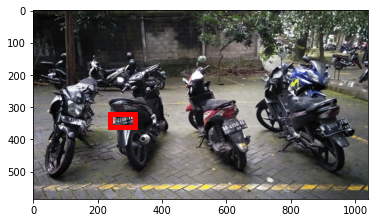

In [ ]:
bounding_box_sample_plot(data_table=test_data, type= 'test')

In [ ]:
from tqdm import tqdm

def save_bb_plots(data_table, type):
  for instance in tqdm(range(len(data_table))):
    # Open image based on the location
    full_dir = os.path.join('./data/Plate Number Data/images', type, data_table.loc[instance, 'files'])
    im = Image.open(full_dir)
    
    # Create figure and axes
    fig, ax = plt.subplots()

    # # Display the image
    ax.imshow(im)

    # Create a Rectangle patch
    xmin= int(data_table.loc[instance, 'xmin'])
    ymin= int(data_table.loc[instance, 'ymin'])
    xmax= int(data_table.loc[instance, 'xmax'])
    ymax= int(data_table.loc[instance, 'ymax'])
    rect = patches.Rectangle((xmin, ymin), xmax, ymax, linewidth=5, edgecolor='r', facecolor='none')

    # Add the patch to the Axes
    ax.add_patch(rect)

    # Save Figure to path
    path = os.path.join('./data/Plate Number Data/ANNOTATED IMAGES', type, data_table.loc[instance, 'filename'] + '.png')
    plt.savefig(path)
    plt.close(fig)


save_bb_plots(data_table=training_data, type = 'train')
save_bb_plots(data_table=test_data, type = 'test')

After revision to the annotations is done, we remake the training and testing data again to prove that the images have been correctly annotated.

In [ ]:
def generate_bndbox(xml_path):

  tree = ElementTree()
  tree.parse(xml_path)
  roottree = tree.getroot()

  xmin_list = []
  ymin_list = []
  xmax_list = []
  ymax_list = []

  for root in roottree:
    if root.tag == 'object':
      for root2 in root:
        if root2.tag == 'bndbox':
          for root3 in root2:
            if root3.tag == 'xmin':
              xmin_list.append(int(root3.text))
            if root3.tag == 'ymin':
              ymin_list.append(int(root3.text))
            if root3.tag == 'xmax':
              xmax_list.append(int(root3.text))
            if root3.tag == 'ymax':
              ymax_list.append(int(root3.text))
  return xmin_list, ymin_list, xmax_list, ymax_list

In [ ]:
def plot_bndbox(xml_loc, img_loc):

  # Generate bounding box locations
  xmin_list, ymin_list, xmax_list, ymax_list = generate_bndbox(xml_loc)

  # Open image
  im = Image.open(img_loc)
  
  # Create figure and axes
  fig, ax = plt.subplots()

  # Display the image
  ax.imshow(im)

  # For every bounding box, plot it into the image
  for index in range(len(xmin_list)):
    rect = patches.Rectangle((xmin_list[index], ymin_list[index]), 
                             width= xmax_list[index] - xmin_list[index],
                             height= ymax_list[index] - ymin_list[index], 
                             linewidth=3, edgecolor='r', facecolor='none')
    # Add the patch to the Axes
    ax.add_patch(rect)
  plt.show()

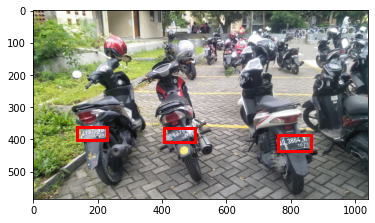

In [ ]:
plot_bndbox(xml_loc = './data/Plate Number Data/Revised Annotations/train/IMG-20180108-WA0038.xml', 
            img_loc = './data/Plate Number Data/images/train/IMG-20180108-WA0038.jpg')

In [ ]:
def bounding_box_sample_plot(data_table, type):
  random_integer = randint(0,len(data_table))
  # Open image based on the location
  full_dir = os.path.join('./data/Plate Number Data/images', type, data_table.loc[random_integer, 'files'])
  im = Image.open(full_dir)
  
  # Create figure and axes
  fig, ax = plt.subplots()

  # Display the image
  ax.imshow(im)

  # Create a Rectangle patch
  xmin= int(data_table.loc[random_integer, 'xmin'])
  ymin= int(data_table.loc[random_integer, 'ymin'])
  xmax= int(data_table.loc[random_integer, 'xmax'])
  ymax= int(data_table.loc[random_integer, 'ymax'])
  print('xmin: {}'.format(xmin))
  print('ymin: {}'.format(ymin))
  print('xmax: {}'.format(xmax))
  print('ymax: {}'.format(ymax))
  print('Data: {}'.format(random_integer))
  rect = patches.Rectangle((xmin, ymin), xmax, ymax, linewidth=5, edgecolor='r', facecolor='none')

  # Add the patch to the Axes
  ax.add_patch(rect)

  plt.show()

([135, 407, 760], [363, 366, 386], [229, 501, 862], [401, 408, 435])

In [ ]:
# Convert the info dict to the required yolo format and write it to disk
def convert_to_yolov5(info_dict):
    print_buffer = []
    
    # For each bounding box
    for b in info_dict["bboxes"]:
        try:
            class_id = class_name_to_id_mapping[b["class"]]
        except KeyError:
            print("Invalid Class. Must be one from ", class_name_to_id_mapping.keys())
        
        # Transform the bbox co-ordinates as per the format required by YOLO v5
        b_center_x = (b["xmin"] + b["xmax"]) / 2 
        b_center_y = (b["ymin"] + b["ymax"]) / 2
        b_width    = (b["xmax"] - b["xmin"])
        b_height   = (b["ymax"] - b["ymin"])
        
        # Normalise the co-ordinates by the dimensions of the image
        image_w, image_h, image_c = info_dict["image_size"]  
        b_center_x /= image_w 
        b_center_y /= image_h 
        b_width    /= image_w 
        b_height   /= image_h 
        
        #Write the bbox details to the file 
        print_buffer.append("{} {:.3f} {:.3f} {:.3f} {:.3f}".format(class_id, b_center_x, b_center_y, b_width, b_height))
        
    # Name of the file which we have to save 
    save_file_name = os.path.join("annotations", info_dict["filename"].replace("png", "txt"))
    
    # Save the annotation to disk
    print("\n".join(print_buffer), file= open(save_file_name, "w"))


In [ ]:
# File Directories

annot_test_dir='/content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/Revised Annotations/test'
annot_train_dir='/content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/Revised Annotations/train'

images_test_dir='/content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test'
images_train_dir='/content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/train'


test_dir='/content/drive/MyDrive/Colab Notebooks/TensorFlow/workspace/images/test'
train_dir='/content/drive/MyDrive/Colab Notebooks/TensorFlow/workspace/images/train'

In [ ]:
# # Example of an xml file path
# x = '/content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/Revised Annotations/test/351.E 6730 RC-07-19.xml'

In [ ]:
def get_size(path):
  tree = ElementTree()
  tree.parse(path)
  roottree = tree.getroot()

  for root in roottree:
    if root.tag == 'size':
      for root2 in root:
        if root2.tag == 'width':
          width = int(root2.text)
        elif root2.tag == 'height':
          height = int(root2.text)
  return [width, height]

def get_filename(path):
  tree = ElementTree()
  tree.parse(path)
  roottree = tree.getroot()

  for root in roottree:
    if root.tag == 'filename':
      filename = root.text
  return filename

In [ ]:
def generate_csv(annot_path):
  
  filenames=[]
  widths=[]
  heights=[]
  class_=[]
  xmin=[]
  ymin=[]
  xmax=[]
  ymax=[]
  for file in os.listdir(annot_path):
    xml_path = os.path.join(annot_path, file)
    xmin_list, ymin_list, xmax_list, ymax_list = generate_bndbox(xml_path)
    width, height = get_size(xml_path)
    filename = get_filename(xml_path)

    for i in range(len(xmin_list)):
      filenames.append(filename)
      widths.append(width)
      heights.append(height)
      class_.append('plate')
      xmin.append(xmin_list[i])
      ymin.append(ymin_list[i])
      xmax.append(xmax_list[i])
      ymax.append(ymax_list[i])

  column_name= ["filename,width,height,class,xmin,ymin,xmax,ymax"]
  csv = pd.DataFrame({'filename':filenames,
                      'width':widths,
                      'height':heights,
                      'class':class_,
                      'xmin':xmin,
                      'ymin':ymin,
                      'xmax':xmax,
                      'ymax':ymax})
  return csv

In [ ]:
csv_train = generate_csv(annot_train_dir)
csv_test = generate_csv(annot_test_dir)

In [ ]:
csv_train.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,207.E 4396 RU-12-17.jpeg,423,169,plate,1,4,421,168
1,200.E 6978 OW-09-20.jpg,100,49,plate,2,3,97,43
2,195.E 2110 QP-12-19.jpeg,376,154,plate,1,1,374,154
3,217.E 4992 SW-06-15.jpg,731,339,plate,1,1,731,337
4,186.E 6173 IM-11-18.jpeg,374,149,plate,1,1,374,148


In [ ]:
csv_train.to_csv('/content/drive/MyDrive/Colab Notebooks/TensorFlow/workspace/training_demo/images/train/train_labels.csv')
csv_test.to_csv('/content/drive/MyDrive/Colab Notebooks/TensorFlow/workspace/training_demo/images/test/test_labels.csv')

In [ ]:
# # Only run once
# # Move images and annotations from data/Plate Number Data to workspace/images

# def copy_files(src_dir, dst_dir):

#   for files in os.listdir(src_dir):
#     src_path = os.path.join(src_dir, files)
#     dst_path = os.path.join(dst_dir, files)
#     shutil.copy(src=src_path, dst=dst_path)

#   print('Done!')
# # # copy_files(annot_test_dir, test_dir)
# # # copy_files(images_test_dir, test_dir)
# # copy_files(annot_train_dir, train_dir)
# # copy_files(images_train_dir, train_dir)

# **YOLOv3 Model For Object Detection**

In [ ]:
!python ./yolov3/detect.py --weights yolov3.pt --img 640 --conf 0.25 --source data/MobilCoco/JPEGImages/agya20.jpg

detect: weights=['yolov3.pt'], source=data/MobilCoco/JPEGImages/agya20.jpg, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov3/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv3 🚀 2022-1-27 torch 1.10.0+cu111 CPU

Fusing layers... 
Model Summary: 261 layers, 61922845 parameters, 0 gradients, 156.1 GFLOPs
image 1/1 /content/drive/MyDrive/SKRIPSI/ML Model/data/MobilCoco/JPEGImages/agya20.jpg: 480x640 2 cars, Done. (2.142s)
Speed: 2.6ms pre-process, 2142.2ms inference, 1.6ms NMS per image at shape (1, 3, 640, 640)
Results saved to yolov3/runs/detect/exp7


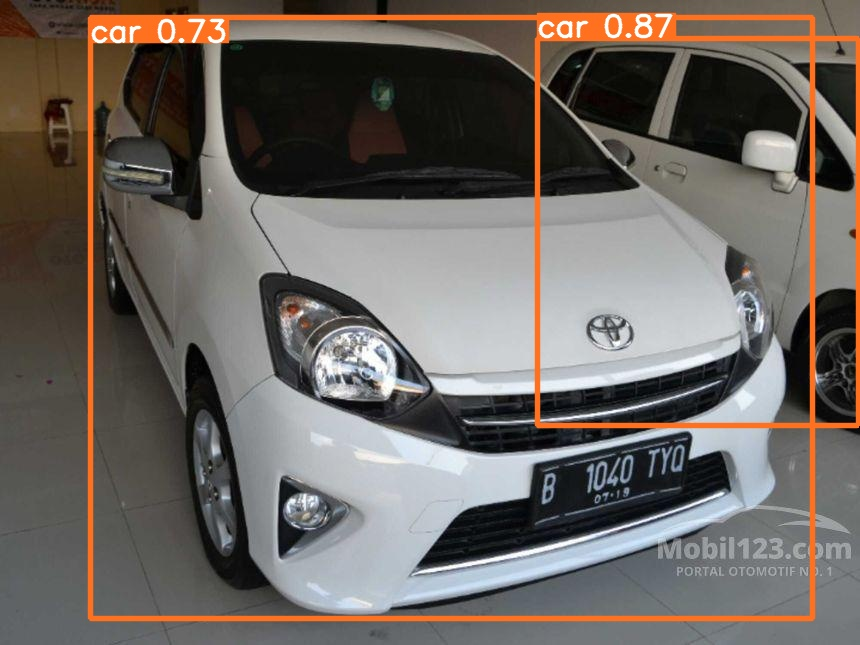

In [ ]:
display.Image(filename='yolov3/runs/detect/exp7/agya20.jpg', width=600)

# **TensorFlow Object Detection API**

## API Installation

In [ ]:
# !apt-get install -y -qq protobuf-compiler python-pil python-lxml

In [ ]:
# !git clone --quiet https://github.com/tensorflow/models.git

In [ ]:
# !pip install --target=$nb_path tensorflow-object-detection-api

In [8]:
os.chdir('/content/drive/MyDrive/SKRIPSI/ML_Model/models/research')
# !protoc object_detection/protos/*.proto --python_out=.

In [ ]:
# !cp object_detection/packages/tf2/setup.py . 

In [ ]:
# !python -m pip install . --target=$nb_path
# !pip install --target=$nb_path object_detection/packages/tf2/.

In [ ]:
# pip install -target=$nb_path tf_slim

In [9]:
pip install --upgrade tf_slim

     |████████████████████████████████| 352 kB 6.7 MB/s 


In [ ]:
# pip install -target=$nb_path tensorflow_io

In [10]:
pip install --upgrade tensorflow_io

     |████████████████████████████████| 23.4 MB 1.3 MB/s 


In [ ]:
# pip install -target=$nb_path tf-models-official

In [11]:
os.environ['PYTHONPATH'] += ":/content/drive/MyDrive/SKRIPSI/ML_Model/models"
sys.path.append("/content/drive/MyDrive/SKRIPSI/ML_Model/models/")
os.environ['PYTHONPATH'] = '/content/drive/MyDrive/SKRIPSI/ML_Model/models/research:/content/models/research/slim:' + os.environ['PYTHONPATH']

In [12]:
# Only run once
# To test the setup process
!python '/content/drive/MyDrive/SKRIPSI/ML_Model/models/research/object_detection/builders/model_builder_tf2_test.py'

2022-02-10 13:28:27.364776: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Running tests under Python 3.7.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
W0210 13:28:27.853844 140530981017472 model_builder.py:1100] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 0.8s
I0210 13:28:28.169822 140530981017472 test_util.py:2309] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 0.8s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 0.92s
I0210 13:28:29.092103 140530981017472 test_util.py:2309] time(__main__.ModelBuilderTF2Test.test_crea

## Generate TF.RECORD

In [ ]:
os.chdir('/content/drive/MyDrive/Colab Notebooks/TensorFlow/scripts/preprocessing')

In [ ]:
## UNUSED

# #run the cell to generate test.record and train.record
# !python generate_tfrecord.py -x '/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/images/train' \
# -l '/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt' \
# -o '/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/annotations/train.record'
# !python generate_tfrecord.py -x '/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/images/test' \
# -l '/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt' \
# -o '/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/annotations/test.record'



# # !python generate_tfrecord.py -x '[path_to_train_folder]' -l '[path_to_annotations_folder]/label_map.pbtxt' -o '[path_to_annotations_folder]/train.record'
# # !python generate_tfrecord.py -x '[path_to_test_folder]' -l '[path_to_annotations_folder]/label_map.pbtxt' -o '[path_to_annotations_folder]/test.record'

In [ ]:
#run the cell to generate test.record and train.record

!python generate_tfrecord.py --label=plate --csv_input='/content/drive/MyDrive/Colab Notebooks/TensorFlow/workspace/training_demo/images/train/train_labels.csv' \
 --image_dir='/content/drive/MyDrive/Colab Notebooks/TensorFlow/workspace/training_demo/images/train' \
 --output_path='/content/drive/MyDrive/Colab Notebooks/TensorFlow/workspace/training_demo/annotations/train.record'

In [ ]:
!python generate_tfrecord.py --label=plate --csv_input='/content/drive/MyDrive/Colab Notebooks/TensorFlow/workspace/training_demo/images/test/test_labels.csv' \
 --image_dir='/content/drive/MyDrive/Colab Notebooks/TensorFlow/workspace/training_demo/images/test' \
 --output_path='/content/drive/MyDrive/Colab Notebooks/TensorFlow/workspace/training_demo/annotations/test.record'

In [ ]:
# path_to_trainrecord="/content/drive/MyDrive/SKRIPSI/ML_Model/Notebook/TensorFlow/workspace/training_demo/annotations/train.record"
# import tensorflow as tf 
# raw_dataset = tf.data.TFRecordDataset(path_to_trainrecord)

# for raw_record in raw_dataset.take(1):
#     example = tf.train.Example()
#     example.ParseFromString(raw_record.numpy())
#     print(example)

## Copy model_main_tf2.py

In [ ]:
# Run Once
# model_main_path = os.path.join('/content/drive/MyDrive/SKRIPSI/ML_Model/models/research/object_detection', 'model_main_tf2.py')
# exporter_main_path = os.path.join('/content/drive/MyDrive/SKRIPSI/ML_Model/models/research/object_detection', 'exporter_main_v2.py')
# training_demo_loc = '/content/drive/MyDrive/Colab Notebooks/TensorFlow/workspace/training_demo'
# shutil.copy(model_main_path,training_demo_loc)
# shutil.copy(exporter_main_path,training_demo_loc)

'/content/drive/MyDrive/Colab Notebooks/TensorFlow/workspace/training_demo/exporter_main_v2.py'

## Start TensorBoard

In [ ]:
#CHANGE DIRECTORY INTO training_demo
os.chdir('/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo')

In [ ]:
#start the Tensorboard
# %load_ext tensorboard
%reload_ext tensorboard
%tensorboard --logdir models/my_ssd_resnet_v1_fpn

# %load_ext tensorboard
# %tensorboard --logdir=models/[name_of_pre-trained-model_you_downloaded]

<IPython.core.display.Javascript object>

In [ ]:
# pip install -target=$nb_path lvis

In [ ]:
pip install --upgrade lvis

In [ ]:
# pip install tensorflow_addons

In [ ]:
pip install --upgrade tensorflow_addons

     |████████████████████████████████| 1.1 MB 4.6 MB/s 


## **Train The Model**

In [ ]:
# TRAIN THE MODEL

!python model_main_tf2.py \
--model_dir='/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/models/my_ssd_resnet_v1_fpn' \
--pipeline_config_path='/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/models/my_ssd_resnet_v1_fpn/pipeline.config'

# !python model_main_tf2.py --model_dir=models/[name_of_pre-trained-model_you_downloaded] --pipeline_config_path=models/[name_of_pre-trained-model_you_downloaded]/pipeline.config

2022-02-10 02:20:07.747025: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0210 02:20:07.751207 140553914476416 mirrored_strategy.py:376] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: None
I0210 02:20:08.154111 140553914476416 config_util.py:552] Maybe overwriting train_steps: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0210 02:20:08.154483 140553914476416 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W0210 02:20:08.198765 140553914476416 deprecation.py:347] From /content/drive/MyDrive/SKRIPSI/ML_Model/models/research/object_detection/model_lib_v2.py:564: Strate

In [ ]:
!python '/content/drive/My Drive/SKRIPSI/ML_Model/models/research/object_detection/model_main.py' \
--pipeline_config_path='/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/models/my_ssd_resnet_v1_fpn/pipeline.config' \
--model_dir='/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/models/my_ssd_resnet_v1_fpn' \
--checkpoint_dir='/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/models/my_ssd_resnet_v1_fpn' \
--run_once=True

## **Export Trained Model**

In [ ]:
!python '/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/exporter_main_v2.py' \
--input_type image_tensor \
--pipeline_config_path '/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/models/my_ssd_resnet_v1_fpn/pipeline.config' \
--trained_checkpoint_dir '/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/models/my_ssd_resnet_v1_fpn/' \
--output_directory '/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/exported-models/my_model'

2022-02-10 04:58:18.101107: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0210 04:58:20.697226 140189636872064 deprecation.py:619] From /usr/local/lib/python3.7/dist-packages/tensorflow/python/autograph/impl/api.py:464: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with back_prop=False is deprecated and will be removed in a future version.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0210 04:58:58.838639 140189636872064 save_impl.py:72] Skipping full serialization of Ker

## **Testing The Model**

In [13]:
import tensorflow as tf
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils


PATH_TO_SAVED_MODEL="/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/exported-models/my_model/saved_model"
print('Loading model...', end='')


# Load saved model and build the detection function
detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')

Loading model...Done!


In [14]:
#Loading the label_map
category_index=label_map_util.create_category_index_from_labelmap("/content/drive/My Drive/Colab Notebooks/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt",use_display_name=True)

In [15]:
print(category_index)

{1: {'id': 1, 'name': 'plate'}}


In [16]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import random

In [26]:
def load_image_into_numpy_array(path):
    return np.array(Image.open(path))

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/train/IMG-20180108-WA0100.jpg... Done


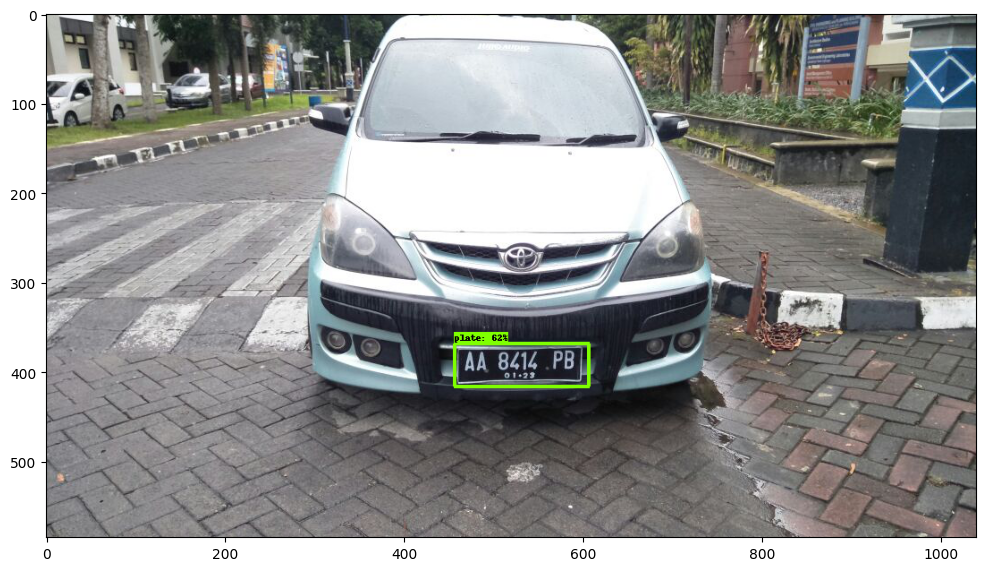

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0114.jpg... Done


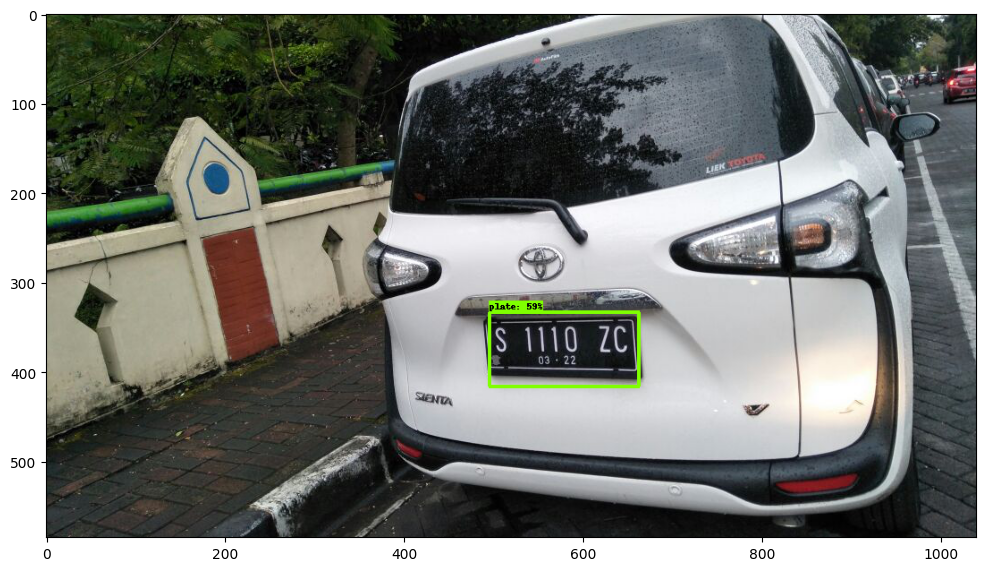

In [ ]:
# img=random.sample(os.listdir('/content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/train/'), 6)

img_path = ['/content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/train/IMG-20180108-WA0100.jpg',
       '/content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0114.jpg']
# img_path = [os.path.join('/content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/train/', x) for x in img]


for image_path in img_path:
  print('Running inference for {}... '.format(image_path), end='')
  image_np=load_image_into_numpy_array(image_path)
  input_tensor=tf.convert_to_tensor(image_np)
  input_tensor=input_tensor[tf.newaxis, ...]
  detections=detect_fn(input_tensor)
  num_detections=int(detections.pop('num_detections'))
  detections={key:value[0,:num_detections].numpy() for key,value in detections.items()}
  
  detections['num_detections']=num_detections
  detections['detection_classes']=detections['detection_classes'].astype(np.int64)
  image_np_with_detections=image_np.copy()

  viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=20,     
          min_score_thresh=0.5,      
          agnostic_mode=False)
  
  %matplotlib inline
  plt.figure(figsize=(12, 12), dpi=100)
  plt.imshow(image_np_with_detections)
  print('Done')
  plt.show()

In [29]:
from tqdm import tqdm

files_list = os.listdir('/content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test')
abs_path = '/content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test'

def plot_prediction(files_list, abspath):
  for file in tqdm(files_list):
    image_path = os.path.join(abspath, file)
    print('Running inference for {}... '.format(image_path), end='')
    image_np=load_image_into_numpy_array(image_path)
    input_tensor=tf.convert_to_tensor(image_np)
    input_tensor=input_tensor[tf.newaxis, ...]
    detections=detect_fn(input_tensor)
    num_detections=int(detections.pop('num_detections'))
    detections={key:value[0,:num_detections].numpy() for key,value in detections.items()}
    
    detections['num_detections']=num_detections
    detections['detection_classes']=detections['detection_classes'].astype(np.int64)
    image_np_with_detections=image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
            image_np_with_detections,
            detections['detection_boxes'],
            detections['detection_classes'],
            detections['detection_scores'],
            category_index,
            use_normalized_coordinates=True,
            max_boxes_to_draw=20,     
            min_score_thresh=0.5,      
            agnostic_mode=False)
    
    %matplotlib inline
    path = os.path.join('/content/drive/MyDrive/SKRIPSI/ML_Model/Prediction Samples',file)
    fig = plt.figure(figsize=(12, 12), dpi=300)
    plt.imshow(image_np_with_detections)
    print('Done')
    plt.savefig(path, dpi=300)
    plt.close(fig)

In [30]:
plot_prediction(files_list, abs_path)

  0%|          | 0/30 [00:00<?, ?it/s]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0117.jpg... Done


  3%|▎         | 1/30 [00:04<02:08,  4.45s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0115.jpg... Done


  7%|▋         | 2/30 [00:07<01:46,  3.81s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/363.E 6263 RU-07-20.jpg... Done


 10%|█         | 3/30 [00:11<01:35,  3.54s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/356.E 6225 SJ-11-19.jpeg... 

 13%|█▎        | 4/30 [00:14<01:28,  3.42s/it]

Done
Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/358.E 3438 SJ-10-19.jpg... 

 17%|█▋        | 5/30 [00:17<01:23,  3.34s/it]

Done
Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/357.E 4679 PAD-06-21.jpg... 

 20%|██        | 6/30 [00:20<01:18,  3.29s/it]

Done
Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0105.jpg... Done


 23%|██▎       | 7/30 [00:23<01:15,  3.30s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0106.jpg... Done


 27%|██▋       | 8/30 [00:27<01:12,  3.29s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0121.jpg... Done


 30%|███       | 9/30 [00:30<01:10,  3.35s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0119.jpg... Done


 33%|███▎      | 10/30 [00:34<01:07,  3.35s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0111.jpg... Done


 37%|███▋      | 11/30 [00:37<01:03,  3.36s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0107.jpg... Done


 40%|████      | 12/30 [00:40<01:00,  3.36s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/361.E 3193 PS-08-17.jpeg... Done


 43%|████▎     | 13/30 [00:44<00:57,  3.37s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0112.jpg... Done


 47%|████▋     | 14/30 [00:47<00:53,  3.37s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0110.jpg... Done


 50%|█████     | 15/30 [00:51<00:50,  3.39s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0114.jpg... Done


 53%|█████▎    | 16/30 [00:54<00:47,  3.37s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/359.E 6270 OZ-01-21.jpg... Done


 57%|█████▋    | 17/30 [00:57<00:43,  3.32s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0108.jpg... Done


 60%|██████    | 18/30 [01:00<00:39,  3.32s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/352.E 5053 RG-09-20.jpeg... 

 63%|██████▎   | 19/30 [01:04<00:36,  3.27s/it]

Done
Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0120.jpg... Done


 67%|██████▋   | 20/30 [01:07<00:32,  3.29s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0116.jpg... Done


 70%|███████   | 21/30 [01:10<00:30,  3.39s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/354.E 6250 PAJ-02-22.jpeg... Done


 73%|███████▎  | 22/30 [01:14<00:26,  3.33s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/353.E 6270 SM-06-20.jpeg... Done


 77%|███████▋  | 23/30 [01:17<00:23,  3.33s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/351.E 6730 RC-07-19.jpeg... 

 80%|████████  | 24/30 [01:20<00:19,  3.27s/it]

Done
Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/355.E 6547 PAF-09-21.jpeg... 

 83%|████████▎ | 25/30 [01:23<00:16,  3.23s/it]

Done
Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/362.E 6525 SF-09-21.jpeg... Done


 87%|████████▋ | 26/30 [01:27<00:13,  3.25s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0118.jpg... Done


 90%|█████████ | 27/30 [01:30<00:09,  3.26s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/364.E 6528 P-11-18.jpeg... 

 93%|█████████▎| 28/30 [01:33<00:06,  3.24s/it]

Done
Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0109.jpg... Done


 97%|█████████▋| 29/30 [01:37<00:03,  3.42s/it]

Running inference for /content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/360.E 4690 PAL-04-22.jpg... 

100%|██████████| 30/30 [01:40<00:00,  3.35s/it]

Done


# **Object Recognition: Easy OCR**

In [ ]:
# !pip install --target=$nb_path easyocr

In [ ]:
# pip uninstall opencv-python-headless==4.5.5.62

In [ ]:
# pip install opencv-python-headless==4.5.2.52

In [ ]:
reader = easyocr.Reader(['en'])

CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.


In [ ]:
dir = '/content/drive/MyDrive/SKRIPSI/ML_Model/data/Plate Number Data/images/test/IMG-20180108-WA0114.jpg'

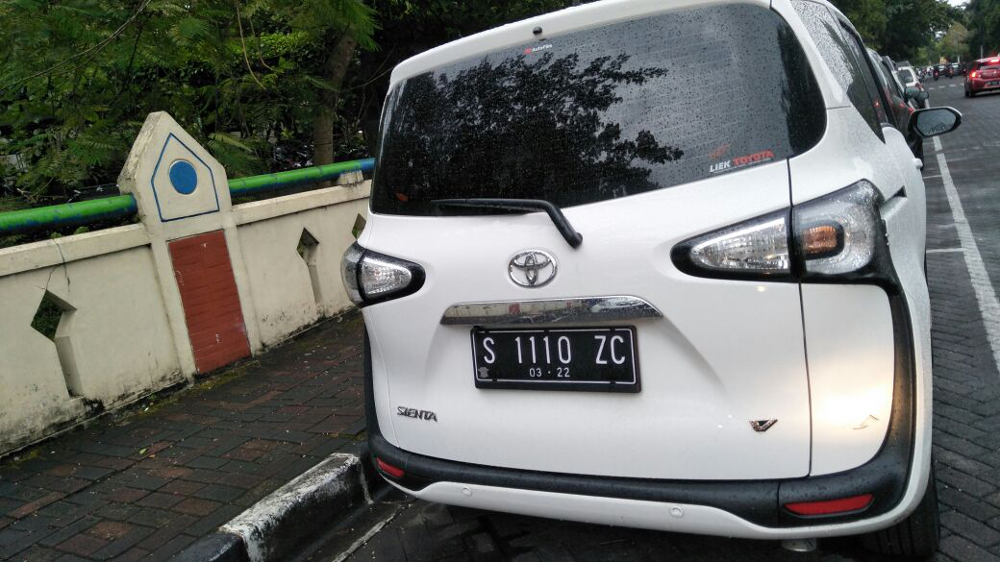

In [ ]:
Image.open(dir)

In [ ]:
bounds = reader.readtext(dir)
bounds

[([[497, 343], [657, 343], [657, 385], [497, 385]],
  'S 1110 ZC',
  0.6818822262889306),
 ([[412.2025477771711, 417.1658598874935],
   [459.98923681778155, 427.79278783148106],
   [455.7974522228289, 443.8341401125065],
   [408.01076318221845, 433.20721216851894]],
  'sm',
  0.10180616819249531)]